# Anime Dataset - User Rating Prediction

## Context:


In [1]:
# import jtplot submodule from jupyterthemes
from jupyterthemes import jtplot

# currently installed theme will be used to
# set plot style if no arguments provided
jtplot.style()

## 1.Import

In [2]:
import warnings
import gc
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=DeprecationWarning)
%matplotlib inline

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import janitor as jn
from sklearn import (
    ensemble,
    model_selection,
    preprocessing,
    tree
)
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    auc,
    confusion_matrix,
    roc_auc_score,
    roc_curve,
    accuracy_score,
    precision_score,
    average_precision_score,
    recall_score,
    f1_score,
    precision_recall_curve,
    cohen_kappa_score,
    confusion_matrix,
    plot_confusion_matrix,
    classification_report
)
from sklearn.model_selection import (
    train_test_split,
    StratifiedKFold,
    cross_val_score,
    cross_val_predict
)
from yellowbrick.classifier import (
    ConfusionMatrix,
    ROCAUC
)
from yellowbrick.model_selection import (
    LearningCurve 
)
from imblearn.over_sampling import (
    SMOTE, ADASYN
)
from seaborn import diverging_palette

In [4]:
sns.set_style('whitegrid')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

font = {'family' : 'Optima',
        'weight' : 'regular',
        'size'   : 16}
plt.rc('font', **font)
plt.rc('xtick', labelsize=15)     # tick labels bigger
plt.rc('ytick', labelsize=15)     # tick labels bigger
plt.rc('savefig', dpi=300)       # higher res outputs

## 2.Load & Merge Dataset into the DataFrame

In [ ]:
#!pip3 install yellowbrick

In [140]:
anime = pd.read_csv('C:/Users/becky/OneDrive/Desktop/anime.csv', low_memory=False)
rating = pd.read_csv('C:/Users/becky/OneDrive/Desktop/rating.csv', low_memory=False)

In [141]:
anime.head()

,anime_id,name,genre,type,episodes,rating,members
0,32281,Kimi no Na wa.,"Drama, Romance, School, Supernatural",Movie,1,9.37,200630
1,5114,Fullmetal Alchemist: Brotherhood,"Action, Adventure, Drama, Fantasy, Magic, Mili...",TV,64,9.26,793665
2,28977,Gintama°,"Action, Comedy, Historical, Parody, Samurai, S...",TV,51,9.25,114262
3,9253,Steins;Gate,"Sci-Fi, Thriller",TV,24,9.17,673572
4,9969,Gintama&#039;,"Action, Comedy, Historical, Parody, Samurai, S...",TV,51,9.16,151266


In [142]:
anime.shape

(12294, 7)

In [143]:
anime = anime.rename(columns={"rating":"anime_rating"})

In [144]:
rating.head()

,user_id,anime_id,rating
0,1,20,-1
1,1,24,-1
2,1,79,-1
3,1,226,-1
4,1,241,-1


In [145]:
rating = rating.rename(columns={"rating":"user_rating"})

In [146]:
rating.shape

(7813737, 3)

In [147]:
#merge the 2 datasets
df = rating.merge(anime, on = "anime_id", how="right")

In [148]:
df.head()

,user_id,anime_id,user_rating,name,genre,type,episodes,anime_rating,members
0,1.0,20,-1.0,Naruto,"Action, Comedy, Martial Arts, Shounen, Super P...",TV,220,7.81,683297
1,3.0,20,8.0,Naruto,"Action, Comedy, Martial Arts, Shounen, Super P...",TV,220,7.81,683297
2,5.0,20,6.0,Naruto,"Action, Comedy, Martial Arts, Shounen, Super P...",TV,220,7.81,683297
3,6.0,20,-1.0,Naruto,"Action, Comedy, Martial Arts, Shounen, Super P...",TV,220,7.81,683297
4,10.0,20,-1.0,Naruto,"Action, Comedy, Martial Arts, Shounen, Super P...",TV,220,7.81,683297


In [149]:
#due to the size of the dataset, we will only work with a sample dataset
df = df.sample(frac=0.1,random_state=1)

In [150]:
#check data type
df.dtypes

user_id         float64
anime_id          int64
user_rating     float64
name             object
genre            object
type             object
episodes         object
anime_rating    float64
members           int64
dtype: object

In [151]:
df.shape

(781482, 9)

In [ ]:
#! pip install pandas-profiling

In [152]:
import pandas_profiling
pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/23 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [162]:
#dimension
df.shape

(781482, 9)

In [163]:
#columns names
df.columns

Index(['user_id', 'anime_id', 'user_rating', 'name', 'genre', 'type',
       'episodes', 'anime_rating', 'members'],
      dtype='object')

## 3.Data Exploration

In [164]:
df.describe()

,user_id,anime_id,user_rating,anime_rating,members
count,781381.000000,781482.000000,781381.000000,781464.000000,7.814820e+05
mean,36717.896003,8916.592203,6.143445,7.652847,1.786777e+05
std,21008.163817,8882.239621,3.729215,0.673361,1.882514e+05
min,1.000000,1.000000,-1.000000,2.000000,1.200000e+01
25%,18955.000000,1243.000000,6.000000,7.260000,4.403000e+04
50%,36791.000000,6213.000000,7.000000,7.680000,1.107480e+05
75%,54774.000000,14131.000000,9.000000,8.130000,2.442680e+05
max,73515.000000,34498.000000,10.000000,9.370000,1.013917e+06


### Missing Values

In [165]:
def missing_values(df):
    mis_val = df.isnull().sum()
    mis_val_percent = 100 * df.isnull().sum() / len(df)
    mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
    mis_val_table_ren_columns = mis_val_table.rename(columns={
        0: 'Missing Values',
        1: '% of Total Values'
    })
    mis_val_table_ren_columns = mis_val_table_ren_columns[
        mis_val_table_ren_columns.iloc[:, 1] != 0].sort_values(
            '% of Total Values', ascending=False).round(1)
    print("Dataframe has " + str(df.shape[1]) + " columns.")
    print("There are " + str(mis_val_table_ren_columns.shape[0]) +
          " columns that have missing values.")
    
    return mis_val_table_ren_columns

In [166]:
# Missing values statistics
miss_values = missing_values(df)
miss_values.head(20)

Dataframe has 9 columns.
There are 5 columns that have missing values.


,Missing Values,% of Total Values
user_id,101,0.0
user_rating,101,0.0
anime_rating,18,0.0
genre,14,0.0
type,3,0.0


### Visualize missing value

In [167]:
#! pip install missingno

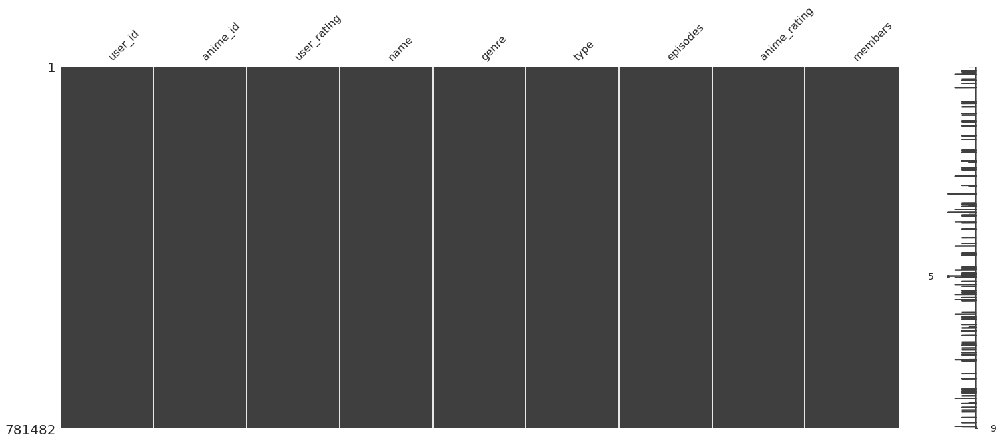

In [168]:
import missingno as msno
ax = msno.matrix(df)

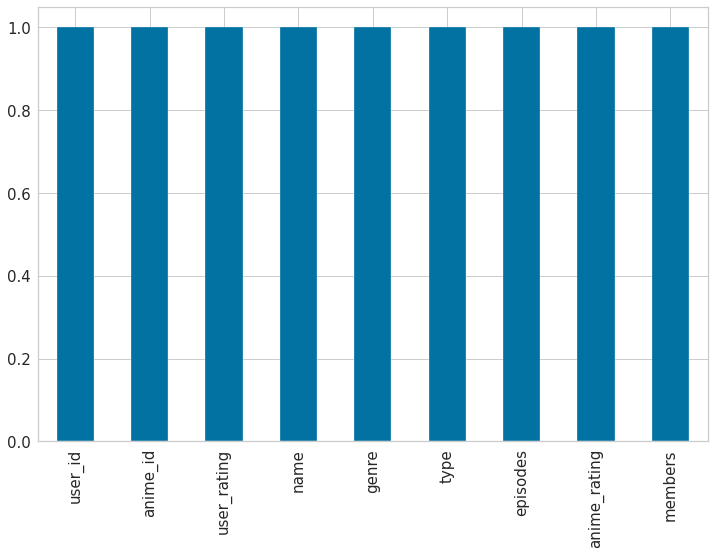

In [169]:
fig, ax = plt.subplots(figsize=(12, 8))
(1 - df.isnull().mean()).abs().plot.bar(ax=ax)

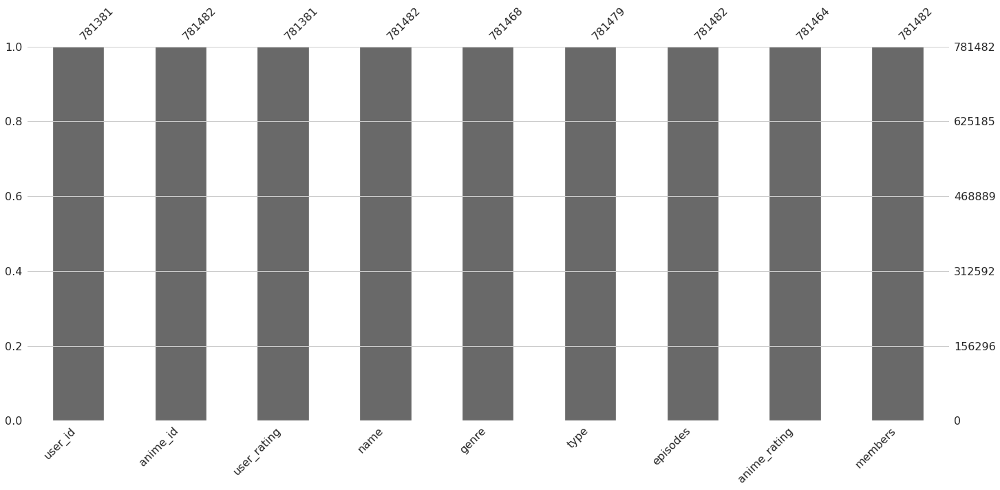

In [170]:
ax = msno.bar(df)

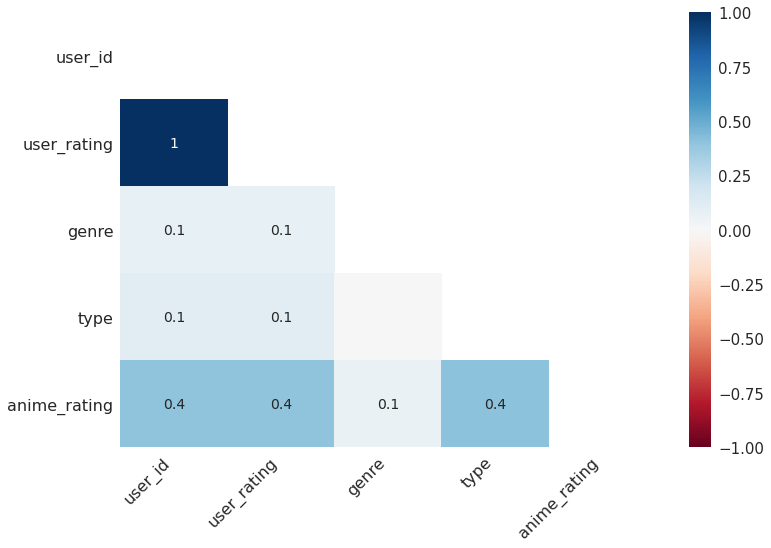

In [171]:
#Missingno correlation heatmap
ax = msno.heatmap(df, figsize=(12, 8))

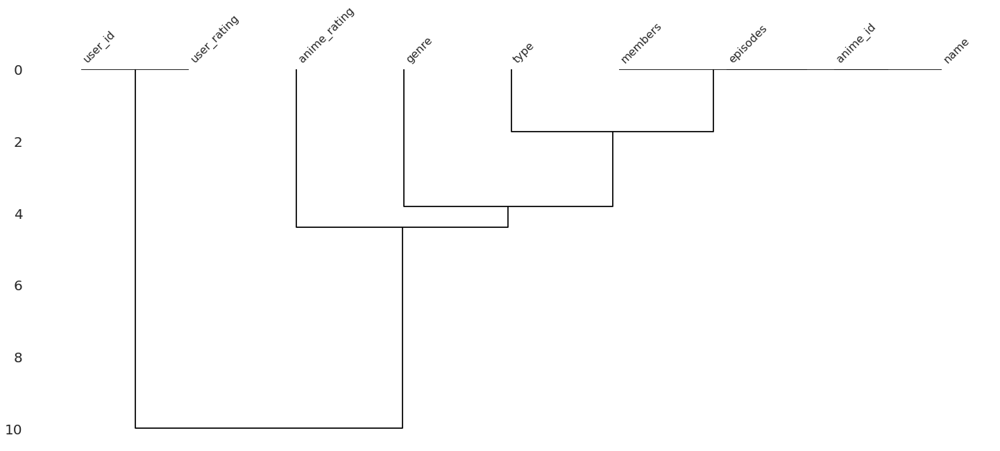

In [172]:
#Dendogram
ax = msno.dendrogram(df)

In [173]:
# drop missing value where user_rating (preditors) is missing
df = df.dropna(subset=["user_rating"])

In [174]:
miss_values = missing_values(df)
miss_values

Dataframe has 9 columns.
There are 3 columns that have missing values.


,Missing Values,% of Total Values
genre,11,0.0
type,1,0.0
anime_rating,1,0.0


In [175]:
#fill missing values of anime_rating using the mean
df['anime_rating'] = df['anime_rating'].fillna(df['anime_rating'].median())

In [176]:
#fill missing values of genre and type with "unknown"
df['genre'] = df['genre'].fillna("unknown")
df['type'] = df['type'].fillna("type")

In [177]:
miss_values = missing_values(df)
miss_values

Dataframe has 9 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values


### Target

In [178]:
df["user_rating"].head()

1134512    10.0
7414206     7.0
3783515     5.0
6407383    -1.0
3469360     6.0
Name: user_rating, dtype: float64

In [179]:
#-1 means that the user did not give a rating, for the purpose of this analysis we will drop all rows with rating = -1
df = df.drop(df[df.user_rating < 0].index)

In [180]:
df.shape

(633651, 9)

### Check top positive and negative correlations with the target

In [181]:
corr = df.corr()['user_rating'].sort_values()

# Display correlations
print('Top 10 - Positive Correlations:')
print('-----------------------------------')
print(corr.tail(10))
print('\nTop 10 - Negative Correlations:')
print('------------------------------')
print(corr.head(10))

Top 10 - Positive Correlations:
-----------------------------------
anime_id       -0.016101
user_id         0.002654
members         0.232200
anime_rating    0.412893
user_rating     1.000000
Name: user_rating, dtype: float64

Top 10 - Negative Correlations:
------------------------------
anime_id       -0.016101
user_id         0.002654
members         0.232200
anime_rating    0.412893
user_rating     1.000000
Name: user_rating, dtype: float64


[Text(0.5, 0, 'user_id'),
 Text(1.5, 0, 'anime_id'),
 Text(2.5, 0, 'user_rating'),
 Text(3.5, 0, 'anime_rating'),
 Text(4.5, 0, 'members')]

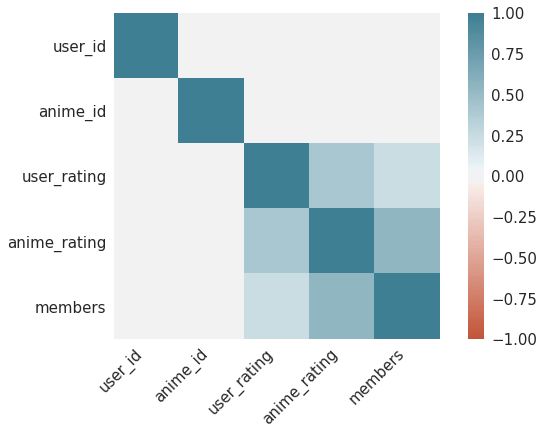

In [182]:
correlation = df.corr()
plt.figure(figsize=(10, 6))
ax = sns.heatmap(
    correlation, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)

In [183]:
#from seaborn import pairplot
#new_df = df.copy()
#vars = ["user_rating", "anime_rating", "members"]
#p = pairplot(
 #   new_df, vars=vars, hue="user_rating", kind="reg"
#)

In [184]:
df.columns

Index(['user_id', 'anime_id', 'user_rating', 'name', 'genre', 'type',
       'episodes', 'anime_rating', 'members'],
      dtype='object')

In [185]:
len(df["name"].unique())

7810

## 4.Data Clean up

In [186]:
#drop feature not useful to the model
df.drop(['user_id', 'anime_id'],
        axis=1,
        inplace=True)

## 5.Data Preparation

### Categorical encoding - genre

In [187]:
len(df)

633651

In [188]:
df["genre"].head()

1134512                       Adventure, Drama, Supernatural
7414206                               Action, Horror, Sci-Fi
3783515    Action, Comedy, Demons, Ecchi, Harem, Romance,...
3469360                                 Comedy, Ecchi, Magic
6888149           Adventure, Comedy, Demons, Fantasy, Shoujo
Name: genre, dtype: object

In [189]:
len(df["genre"])

633651

In [190]:
genre_list = df["genre"].to_list()

In [191]:
len(genre_list)

633651

In [192]:
genre_list[1]

'Action, Horror, Sci-Fi'

In [193]:
for i in range(0,len(genre_list)):
    genre_list[i] = genre_list[i].split(",")

In [194]:
unique_genre = list(set(i for j in genre_list for i in j))

In [195]:
#count the frequency of genre
genre_tot = []
for i in range(0,len(genre_list)):
    for j in range(0,len(genre_list[i])):
        genre_tot.append(genre_list[i][j])

In [196]:
df1 = pd.DataFrame(data = {"genre_name":genre_tot})
freq = df1.groupby(["genre_name"]).size().reset_index()
freq = freq.rename(columns={0:"frequency"})
freq = freq.sort_values(by = "frequency", ascending = False)
top35_genre = freq.head(25)

In [197]:
top35_genre

,genre_name,frequency
42,Action,266267
24,Romance,197502
45,Comedy,193137
37,Supernatural,161652
7,Fantasy,155885
26,School,152597
31,Shounen,150613
27,Sci-Fi,127026
2,Comedy,121799
5,Drama,121021


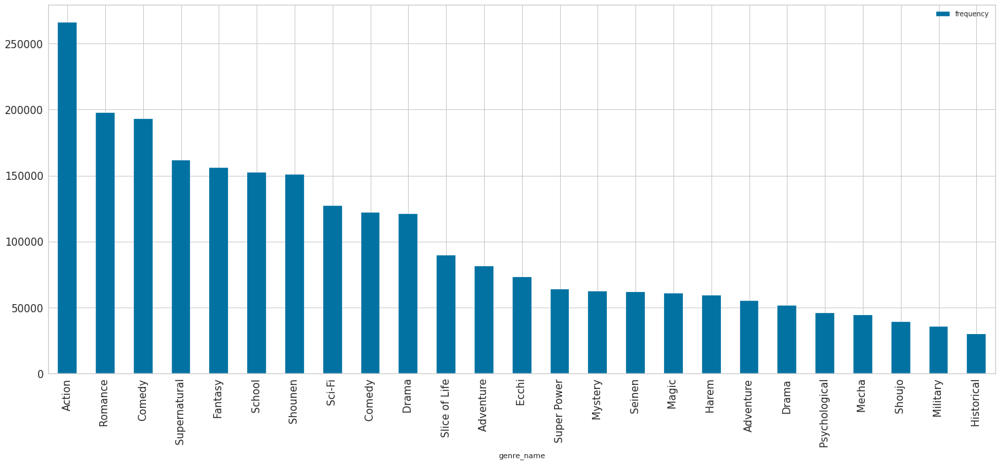

In [198]:
top35_genre.plot(x="genre_name", y="frequency", kind='bar')

In [199]:
nottop35 = freq.reset_index().iloc[25:,:]

In [200]:
nottop35_list = nottop35["genre_name"].to_list()

In [201]:
#we are going to pick the top 35 genre and name the rest as others
top_list = top35_genre["genre_name"].to_list()

In [202]:
list_num = range(0,25)

In [203]:
def genre_encoding(genre_name, num):
    num = []
    for i in range(0,len(genre_list)):
        if genre_name in genre_list[i]:
            num.append(1)
        else: num.append(0)
    return num

In [204]:
for i,j in zip(top_list, list_num):
    df[top_list[j]] = genre_encoding(i,j)

In [205]:
df.head()

,user_rating,name,genre,type,episodes,anime_rating,members,Action,Romance,Comedy,Supernatural,Fantasy,School,Shounen,Sci-Fi,Comedy,Drama,Slice of Life,Adventure,Ecchi,Super Power,Mystery,Seinen,Magic,Harem,Adventure,Drama,Psychological,Mecha,Shoujo,Military,Historical
1134512,10.0,Sen to Chihiro no Kamikakushi,"Adventure, Drama, Supernatural",Movie,1,8.93,466254,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
7414206,7.0,Biohazard: Degeneration,"Action, Horror, Sci-Fi",Movie,1,7.19,20172,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3783515,5.0,High School DxD BorN,"Action, Comedy, Demons, Ecchi, Harem, Romance,...",TV,12,7.71,192171,1,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0
3469360,6.0,Bokusatsu Tenshi Dokuro-chan 2,"Comedy, Ecchi, Magic",OVA,2,6.92,70734,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0
6888149,9.0,Kyou kara Maou!,"Adventure, Comedy, Demons, Fantasy, Shoujo",TV,78,7.88,58150,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0


In [206]:
#other columns
other = []
for i in range(0,len(genre_list)):
    if any(item in genre_list[i] for item in nottop35_list) == True:
        other.append(1)
    else: other.append(0)

In [207]:
from collections import Counter
Counter(other).keys()

dict_keys([0, 1])

In [208]:
df["other_genre"] = other

### Categorical encoding - type

In [209]:
df = pd.get_dummies(df, prefix=["type"], columns=["type"])

### Categorical encoding - name

In [210]:
list_tot = df["name"].to_list()
list_name = []
for i in range(0,len(list_tot)):
    list_name.append(len(list_tot[i]))

In [211]:
df["anime_name_len"] =  list_name

In [212]:
#drop feature not useful to the model
df.drop(['name', 'genre'],
        axis=1,
        inplace=True)

In [213]:
df.head()

,user_rating,episodes,anime_rating,members,Action,Romance,Comedy,Supernatural,Fantasy,School,Shounen,Sci-Fi,Comedy,Drama,Slice of Life,Adventure,Ecchi,Super Power,Mystery,Seinen,Magic,Harem,Adventure,Drama,Psychological,Mecha,Shoujo,Military,Historical,other_genre,type_Movie,type_Music,type_ONA,type_OVA,type_Special,type_TV,type_type,anime_name_len
1134512,10.0,1,8.93,466254,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,29
7414206,7.0,1,7.19,20172,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,23
3783515,5.0,12,7.71,192171,1,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,20
3469360,6.0,2,6.92,70734,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,30
6888149,9.0,78,7.88,58150,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,15


In [214]:
# Missing values statistics
miss_values = missing_values(df)
miss_values.head(50)

Dataframe has 38 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values


In [215]:
df.dtypes

user_rating       float64
episodes           object
anime_rating      float64
members             int64
Action              int64
 Romance            int64
Comedy              int64
 Supernatural       int64
 Fantasy            int64
 School             int64
 Shounen            int64
 Sci-Fi             int64
 Comedy             int64
 Drama              int64
 Slice of Life      int64
 Adventure          int64
 Ecchi              int64
 Super Power        int64
 Mystery            int64
 Seinen             int64
 Magic              int64
 Harem              int64
Adventure           int64
Drama               int64
 Psychological      int64
 Mecha              int64
 Shoujo             int64
 Military           int64
 Historical         int64
other_genre         int64
type_Movie          uint8
type_Music          uint8
type_ONA            uint8
type_OVA            uint8
type_Special        uint8
type_TV             uint8
type_type           uint8
anime_name_len      int64
dtype: objec

In [216]:
df["episodes"].unique()

array(['1', '12', '2', '78', '26', '13', '148', '24', '68', '11', '6',
       '46', '10', '32', '25', '52', '64', '51', '47', '14', '22', '37',
       '7', '50', '3', '34', '4', '75', '23', '167', '27', '109', '54',
       '19', '276', '38', '16', '101', '8', '161', '5', '153', '114',
       '220', '21', '97', '49', '15', '44', '35', '94', '103', '9', '201',
       '296', '69', '60', '39', '45', '110', '43', '70', '62', '175',
       '145', '366', '73', '291', '29', '113', '36', '203', '48', '20',
       '224', '93', '178', '112', '33', '76', '42', '127', '192', '147',
       '79', '102', '61', '63', '74', '180', '130', '92', '40', '30',
       '77', '105', '104', '65', '191', '28', '67', '128', '99', '84',
       '154', '58', '100', '108', '150', '41', '358', '56', '115', '142',
       '98', '18', '260', '31', '91', '155', '172', '137', '195', '330',
       '124', '17', '59', '96', '53', '1565', '1787', '66', '193', '243',
       '55', '72', '694', '88', '373', '86', '170', '164', '11

In [217]:
len(df[df['episodes'] == 'Unknown'])

1

In [218]:
#drop episodes = unknown
df = df.drop(df[df.episodes == 'Unknown'].index)

In [220]:
import pandas_profiling
pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/52 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [221]:
df = df.drop(['type_type'], axis=1)

In [222]:
#export the dataset
df.to_csv(r'/Users/becky/OneDrive/Desktop/clean_df.csv', index=False, header=True)

## 6.Separate Features and Target

In [223]:
X, y = jn.ml.get_features_targets(df, target_columns="user_rating")

### Train test split

In [224]:
len(y)

633650

In [225]:
X_train, X_val_test, y_train, y_val_test = model_selection.train_test_split(
    X, y, test_size=0.3, random_state=42)

In [226]:
print(len(X_train))
print(len(X_val_test))
print(len(y_train))
print(len(y_val_test))

443555
190095
443555
190095


### Test validatioon split

In [227]:
X_val, X_test, y_val, y_test = model_selection.train_test_split(
    X_val_test, y_val_test, test_size=0.5, random_state=42)

In [228]:
print(len(X_val))
print(len(X_test))
print(len(y_val))
print(len(y_test))

95047
95048
95047
95048


In [229]:
X.columns

Index(['episodes', 'anime_rating', 'members', 'Action', ' Romance', 'Comedy',
       ' Supernatural', ' Fantasy', ' School', ' Shounen', ' Sci-Fi',
       ' Comedy', ' Drama', ' Slice of Life', ' Adventure', ' Ecchi',
       ' Super Power', ' Mystery', ' Seinen', ' Magic', ' Harem', 'Adventure',
       'Drama', ' Psychological', ' Mecha', ' Shoujo', ' Military',
       ' Historical', 'other_genre', 'type_Movie', 'type_Music', 'type_ONA',
       'type_OVA', 'type_Special', 'type_TV', 'anime_name_len'],
      dtype='object')

## 7.Baseline Model - DummyRegressor

In [230]:
from sklearn.dummy import DummyRegressor
dummy_regr = DummyRegressor()
dummy_regr.fit(X_train, y_train)
y_test_pred = dummy_regr.predict(X_test)

### MSE with DummyRegressor

In [231]:
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test, y_test_pred)
print(mse)
rmse = mean_squared_error(y_test, y_test_pred, squared=False)
print(rmse)

2.4510745947243318
1.5655908133111702


### Standardize the data

In [232]:
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_val = sc.transform(X_val)
X_test = sc.transform(X_test)

## 8.Modeling

## 8.1 Random Forest

In [233]:
from sklearn.ensemble import RandomForestRegressor

In [234]:
rf = RandomForestRegressor(n_estimators=40, random_state=42)
model1= rf.fit(X_train,y_train)
y_test_pred = model1.predict(X_test)

In [235]:
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test, y_test_pred)
print(mse)

2.0720273740503403


In [236]:
rmse = mean_squared_error(y_test, y_test_pred, squared=False)
print(rmse)

1.439453845752041


findfont: Font family ['Optima'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Optima'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Optima'] not found. Falling back to DejaVu Sans.


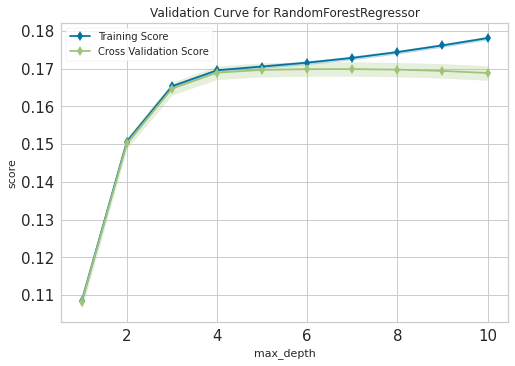

In [87]:
from yellowbrick.model_selection import ValidationCurve

viz = ValidationCurve(
    RandomForestRegressor(n_estimators=40, random_state=42), 
    param_name="max_depth",
    param_range=np.arange(1, 11), 
    cv=5, 
    np_jobs=8
)

# Fit and show the visualizer
viz.fit(X_train, y_train)
viz.poof()

### Create a small dataset

In [237]:
X_train_small = X_train[:100000, :]
y_train_small = y_train[:100000]

### Feature Importance

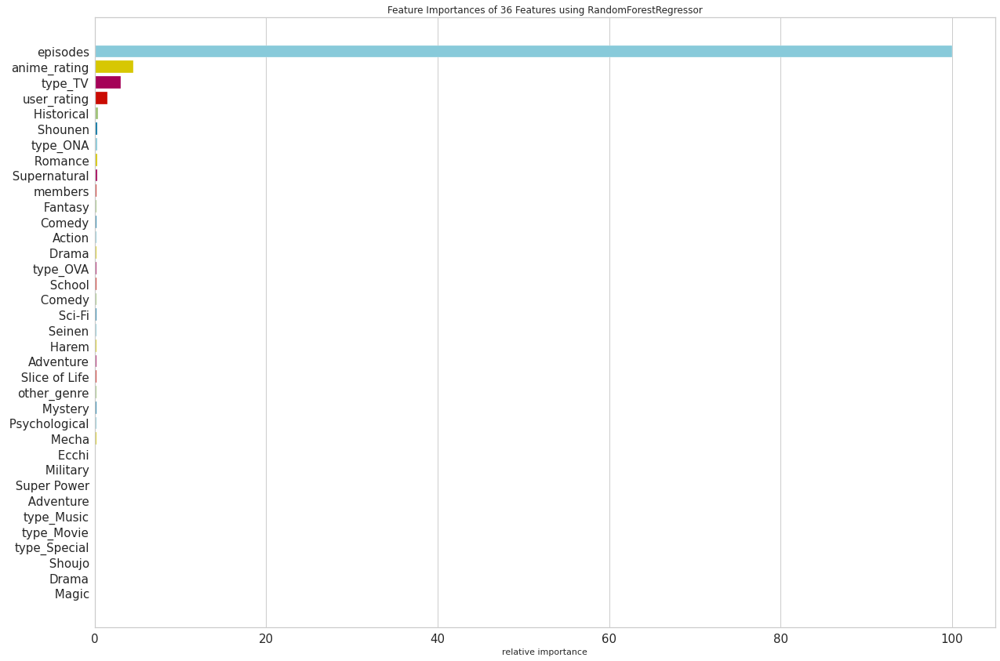

In [238]:
from yellowbrick.model_selection import FeatureImportances

fig = plt.figure(figsize=(18, 12))
viz = FeatureImportances(model1, labels=df.columns)
viz.fit(X_train_small, y_train_small)
viz.poof()

### Hyperparameter tuning with Grid Search

In [90]:
rf_grid = ensemble.RandomForestRegressor()
params = {
    "max_features": [0.4, "auto"],
    "n_estimators": [15, 200],
    "min_samples_leaf": [1, 0.1],
    "random_state": [42],
}
cv = model_selection.GridSearchCV(rf_grid, params,
                                  n_jobs=-1).fit(X_train_small, y_train_small)
print(cv.best_params_)

{'max_features': 'auto', 'min_samples_leaf': 0.1, 'n_estimators': 200, 'random_state': 42}


### Use best hyperparamter with RF

In [91]:
rf_best = ensemble.RandomForestRegressor(
    **{
        "max_features": "auto",
        "min_samples_leaf": 0.1,
        "n_estimators": 200,
        "random_state": 42,
    })
rf_best.fit(X_train, y_train)
rf_best.score(X_test, y_test)

0.14869621311024062

In [129]:
y_test_pred = rf_best.predict(X_test)
# Calculate the mean squared error of the prediction
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test, y_test_pred)
print(mse)

2.086602522781492


In [130]:
rmse = mean_squared_error(y_test, y_test_pred, squared=False)
print(rmse)

1.444507709491885


## 8.2 LightGBM

In [93]:
#!pip install lightgbm

In [249]:
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.model_selection import KFold
import lightgbm as lgb
from lightgbm import LGBMRegressor

In [250]:
# LightGBM parameters found by Bayesian optimization
reg = LGBMRegressor(
            nthread=4,
            n_estimators=10000,
            n_jobs=1,
            learning_rate=0.02,
            num_leaves=34,
            colsample_bytree=0.9497036,
            subsample=0.8715623,
            max_depth=8,
            reg_alpha=0.041545473,
            reg_lambda=0.0735294,
            min_split_gain=0.0222415,
            min_child_weight=39.3259775,
            silent=-1,
            verbose=-1,
            random_state=42
        )
        
# Fit the model 
reg.fit(X_train,
        y_train,
        eval_set=[(X_train, y_train), (X_val, y_val)],
        verbose=1000,
        early_stopping_rounds=200)

[LightGBM] [Warning] num_threads is set with n_jobs=1, nthread=4 will be ignored. Current value: num_threads=1
Training until validation scores don't improve for 200 rounds
Early stopping, best iteration is:
[268]	training's l2: 2.05486	valid_1's l2: 2.04922


LGBMRegressor(colsample_bytree=0.9497036, learning_rate=0.02, max_depth=8,
              min_child_weight=39.3259775, min_split_gain=0.0222415,
              n_estimators=10000, n_jobs=1, nthread=4, num_leaves=34,
              random_state=42, reg_alpha=0.041545473, reg_lambda=0.0735294,
              silent=-1, subsample=0.8715623, verbose=-1)

In [251]:
y_test_pred = reg.predict(X_test)
# Calculate the mean squared error of the prediction
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test, y_test_pred)
print(mse)

2.0333194596028643


In [252]:
rmse = mean_squared_error(y_test, y_test_pred, squared=False)
print(rmse)

1.4259451110063333


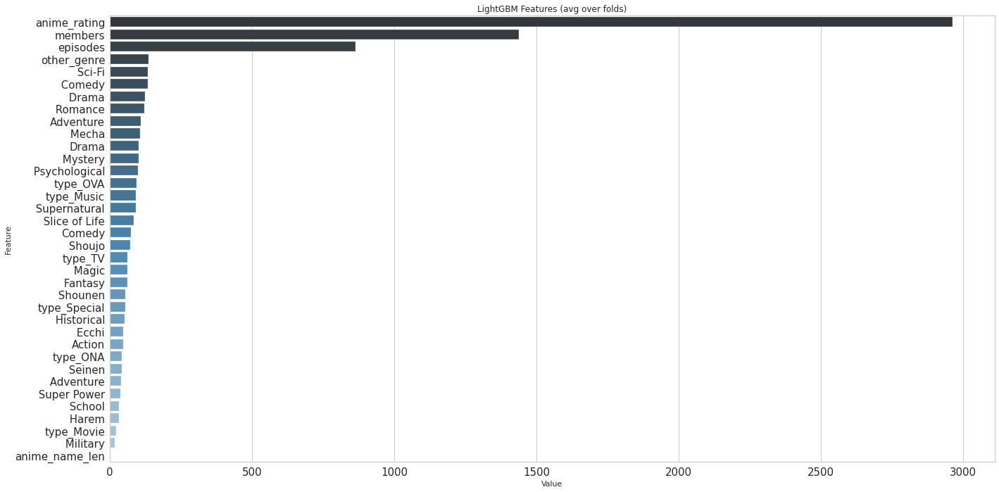

In [244]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# sorted(zip(clf.feature_importances_, X.columns), reverse=True)
feature_imp = pd.DataFrame(sorted(zip(reg.feature_importances_,X.columns)), columns=['Value','Feature'])

plt.figure(figsize=(20, 10))
sns.barplot(x="Value", y="Feature", palette="Blues_d", data=feature_imp.sort_values(by="Value", ascending=False))
plt.title('LightGBM Features (avg over folds)')
plt.tight_layout()
plt.show()
#plt.savefig('lgbm_importances-01.png')

In [246]:
reg.feature_importances_

array([ 863, 2962, 1439,   46,  120,   73,   92,   61,   31,   55,  134,
        134,  124,   84,   40,   48,   36,  101,   43,   61,   31,  108,
        102,   99,  106,   71,   18,   52,  136,   21,   92,   43,   93,
         54,   61,    0, 1210])

## 8.3 XGBoost

In [239]:
# free up some memory
gc.collect()

469088

In [99]:
!pip install xgboost 

In [100]:
import xgboost as xgb

In [101]:
reg_xgb = xgb.XGBRegressor()
reg_xgb.fit(X_train_small, y_train_small)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [102]:
y_test_pred = reg_xgb.predict(X_test)
# Calculate the mean squared error of the prediction
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test, y_test_pred)
print(mse)

2.0741051902806866


In [103]:
! pip install graphviz

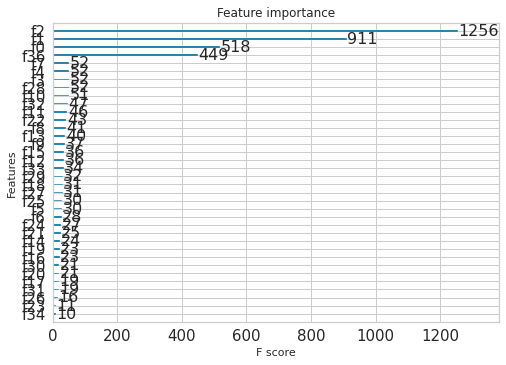

In [104]:
xgb.plot_importance(reg_xgb)
plt.rcParams['figure.figsize'] = [25, 10]
plt.show()

## 8.4 AdaBoost

In [105]:
from sklearn.ensemble import AdaBoostRegressor

In [106]:
reg_ada_boost = AdaBoostRegressor(n_estimators=100, random_state=42)
reg_ada_boost.fit(X_train_small, y_train_small)

AdaBoostRegressor(n_estimators=100, random_state=42)

In [107]:
y_test_pred = reg_ada_boost.predict(X_test)
# Calculate the mean squared error of the prediction
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test, y_test_pred)
print(mse)

2.136469506996219


## 8.5 CatBoost

In [108]:
#!pip install catboost

In [109]:
from catboost import CatBoostRegressor, Pool

In [110]:
reg_cat_boost = CatBoostRegressor(iterations=2,
                                   depth=2,
                                   learning_rate=1,
                                   #loss_function='Logloss',
                                   verbose=True)
# train the model
reg_cat_boost.fit(X_train_small, y_train_small)

0:	learn: 1.4726209	total: 140ms	remaining: 140ms
1:	learn: 1.4586305	total: 144ms	remaining: 0us


In [111]:
y_test_pred = reg_cat_boost.predict(X_test)
# Calculate the mean squared error of the prediction
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test, y_test_pred)
print(mse)

2.0859809430126854


## 8.6 Multi-Layer Perceptron

In [112]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

In [113]:
input_shape = (1, 37)
mlp = Sequential()
mlp.add(Dense(16, input_shape=input_shape, activation='relu'))
mlp.add(Dense(8, activation='relu'))
mlp.add(Dense(1, activation='linear'))

In [114]:
mlp.output_shape
mlp.summary()
mlp.get_config()
mlp.get_weights()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 1, 16)             608       
_________________________________________________________________
dense_1 (Dense)              (None, 1, 8)              136       
_________________________________________________________________
dense_2 (Dense)              (None, 1, 1)              9         
Total params: 753
Trainable params: 753
Non-trainable params: 0
_________________________________________________________________


[array([[-0.28768253, -0.29711944, -0.238392  ,  0.12690878, -0.3172729 ,
         -0.21665671, -0.02818587,  0.33317718,  0.07141024, -0.13909118,
          0.31246087,  0.12503743, -0.08324802, -0.07702792, -0.24267426,
          0.2735202 ],
        [-0.11019161,  0.19070116,  0.04854867,  0.0819796 ,  0.32551596,
         -0.02212587, -0.2409453 ,  0.22952244, -0.04799053, -0.29516748,
          0.22079119, -0.29504377, -0.20829709,  0.11876148,  0.32858023,
         -0.28722987],
        [ 0.30203518,  0.28722736, -0.2538223 , -0.10084993,  0.11315578,
          0.04260036,  0.23714581, -0.28866556,  0.16724625,  0.08554727,
          0.08039719, -0.07063124,  0.30234602, -0.19518013,  0.23546585,
          0.11578602],
        [ 0.2147583 ,  0.10003394, -0.14667004, -0.25859863, -0.3145533 ,
         -0.199275  ,  0.03891045, -0.0860759 ,  0.29332778,  0.01150542,
         -0.09090027, -0.16222821, -0.09670332, -0.01632851,  0.26966563,
          0.0574266 ],
        [-0.10108232

In [115]:
train_y = np.asarray(y_train_small)
mlp.compile(loss='mean_absolute_error', optimizer='adam', metrics=['mean_squared_error'])
mlp.fit(X_train_small, train_y, epochs=25, batch_size=1, verbose=1, validation_split=0.2)


Epoch 1/25
80000/80000 [==============================] - 34s 414us/step - loss: 1.3646 - mean_squared_error: 3.7123 - val_loss: 1.1471 - val_mean_squared_error: 2.1750
Epoch 2/25
80000/80000 [==============================] - 32s 405us/step - loss: 1.1445 - mean_squared_error: 2.1949 - val_loss: 1.1279 - val_mean_squared_error: 2.1232
Epoch 3/25
80000/80000 [==============================] - 33s 410us/step - loss: 1.1242 - mean_squared_error: 2.1385 - val_loss: 1.1469 - val_mean_squared_error: 2.2365
Epoch 4/25
80000/80000 [==============================] - 33s 413us/step - loss: 1.1140 - mean_squared_error: 2.1025 - val_loss: 1.1252 - val_mean_squared_error: 2.1266
Epoch 5/25
80000/80000 [==============================] - 33s 410us/step - loss: 1.1205 - mean_squared_error: 2.1346 - val_loss: 1.1324 - val_mean_squared_error: 2.1341
Epoch 6/25
80000/80000 [==============================] - 33s 407us/step - loss: 1.1231 - mean_squared_error: 2.1531 - val_loss: 1.1210 - val_mean_squared_

In [117]:
y_test_pred = mlp.predict(X_test)
# Calculate the mean squared error of the prediction
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test, y_test_pred)
print(mse)
rmse = mean_squared_error(y_test, y_test_pred, squared=False)
print(rmse)

2.0830722499292342
1.4432852281961575


## 8.7 Try Different Regressors (other than the ones mentioned above)

In [118]:
# free up some memory
gc.collect()

7872

In [121]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

In [120]:
for model in [
    LinearRegression,
    DecisionTreeRegressor,
    GaussianNB,
    #SVC,
    KNeighborsRegressor,
]:
    reg = model()
    reg.fit(X_train_small, y_train_small)
    print(f"{model.__name__:22}")
    y_test_pred = reg.predict(X_test)
    # Calculate the mean squared error of the prediction
    from sklearn.metrics import mean_squared_error
    mse = mean_squared_error(y_test, y_test_pred)
    print(mse)

LinearRegression      
2.03492779531224
DecisionTreeRegressor 
2.1975776231518522
GaussianNB            
4.507764497937884
KNeighborsRegressor   
2.452632775018938
